<a href="https://colab.research.google.com/github/marissa-graham/deep_learning/blob/master/Lab_8_(Wasserstein_GANs).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Installs and Imports

In [0]:
!pip3 install pillow==4.1.1
!pip3 install torch torchvision tqdm

    100% |████████████████████████████████| 5.7MB 6.9MB/s 
  Found existing installation: Pillow 4.0.0
    Uninstalling Pillow-4.0.0:
      Successfully uninstalled Pillow-4.0.0
    100% |████████████████████████████████| 519.5MB 30kB/s 
tcmalloc: large alloc 1073750016 bytes == 0x5910e000 @  0x7f49219be2a4 0x594e17 0x626104 0x51190a 0x4f5277 0x510c78 0x5119bd 0x4f5277 0x4f3338 0x510fb0 0x5119bd 0x4f5277 0x4f3338 0x510fb0 0x5119bd 0x4f5277 0x4f3338 0x510fb0 0x5119bd 0x4f6070 0x510c78 0x5119bd 0x4f5277 0x4f3338 0x510fb0 0x5119bd 0x4f6070 0x4f3338 0x510fb0 0x5119bd 0x4f6070
    100% |████████████████████████████████| 61kB 21.0MB/s 


In [0]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import grad
from torch.utils.data import Dataset, DataLoader

import os
import seaborn
import numpy as np
from scipy import linalg as la
from matplotlib import pyplot as plt
from torchvision import transforms, utils, datasets
from tqdm import tqdm

assert torch.cuda.is_available()

from PIL import Image
def register_extension(id, extension): 
    Image.EXTENSION[extension.lower()] = id.upper()
Image.register_extension = register_extension
def register_extensions(id, extensions): 
    for extension in extensions: 
        register_extension(id, extension)
Image.register_extensions = register_extensions

## Load the data

In [0]:
!wget --load-cookies cookies.txt 'https://docs.google.com/uc?export=download&confirm='"$(wget --save-cookies cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=0B7EVK8r0v71pZjFTYXZWM3FlRnM' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')"'&id=0B7EVK8r0v71pZjFTYXZWM3FlRnM' -O img_align_celeba.zip
!unzip -q img_align_celeba
!mkdir test
!mv img_align_celeba test

--2018-11-06 23:02:02--  https://docs.google.com/uc?export=download&id=0B7EVK8r0v71pZjFTYXZWM3FlRnM
Resolving docs.google.com (docs.google.com)... 108.177.112.138, 108.177.112.139, 108.177.112.101, ...
Connecting to docs.google.com (docs.google.com)|108.177.112.138|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘STDOUT’

-                       [ <=>                ]   3.16K  --.-KB/s    in 0s      

2018-11-06 23:02:03 (28.1 MB/s) - written to stdout [3238]

--2018-11-06 23:02:03--  https://docs.google.com/uc?export=download&confirm=paZS&id=0B7EVK8r0v71pZjFTYXZWM3FlRnM
Resolving docs.google.com (docs.google.com)... 108.177.112.113, 108.177.112.102, 108.177.112.100, ...
Connecting to docs.google.com (docs.google.com)|108.177.112.113|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0s-84-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/3krp0gg14f9n

# Model Architecture

## Paper guidelines



* No pooling layers; strided convolutions for discriminator (oh, since it's losing dimensions) and fractionally-strided for generator
* Batchnorms for everybody (except generator output and discriminator input, they said!)
 * Batchnorm = Normalize input to each unit to have zero mean and unit variance
 * But wait, "Improved Training" says no batch normalization in discriminator; recommends layer normalization as a drop-in replacement (I don't know what that is)
* Remove fully connected hidden layers for deeper architectures
* Use ReLU in generator for everything except Tanh for output
* Use LeakyReLU for discriminator

Also note:

* Paper says Adam optimizer with learning rate .0002 (.001 was too high)
 * Reduce momentum term Beta1 in Adam to 0.5 instead of 0.9; stabilizes training
* Impose the gradient norm penalty, aka add to the loss lambda * expected value of (norm of gradient - 1)^2 
 * I think expected value just means "gradient value for this batch"
 * How do we get that? Is it a normally returned thing? (autograd.grad function)
 * lambda = 10, the paper says
 
* The discriminator is being called multiple times; do not create new copies
* Use requires_grad = True for discriminator parameters; easiest way is to iterate through them and update it
* There are two Adam optimizers; make sure they're each training the right things!


## Generator

In [0]:
class Generator(nn.Module):
    
    def __init__(self, start_shape=4):
        
        super(Generator, self).__init__()
        """
        start_shape is how big to start it out as
        resulting image will be 16*start_shape x 16*start_shape
        """
        
        # Shape from a len(100) to a (4*4*1024), reshape to 4x4x1024
        self.start_shape = start_shape
        self.project_z = nn.Linear(100, start_shape*start_shape*1024)
        
        kwargs = {'kernel_size':5, 'stride':2, 'padding':2, 'output_padding':1}
        self.conv_layers = nn.Sequential(
            nn.ConvTranspose2d(1024, 512, **kwargs),
            nn.ReLU(),
            nn.BatchNorm2d(512, momentum=0.9),
            nn.ConvTranspose2d(512, 256, **kwargs),
            nn.ReLU(),
            nn.BatchNorm2d(256, momentum=0.9),
            nn.ConvTranspose2d(256, 128, **kwargs),
            nn.ReLU(),
            nn.BatchNorm2d(128, momentum=0.9),
            nn.ConvTranspose2d(128, 3, **kwargs),
            nn.Sigmoid()
        )
        
    def forward(self, z):
        """
        Input shape (batch_num, 100, 1, 1) 
        Output shape (batch_num, 3, 16*start_shape, 16*start_shape)
        """
        n = z.size()[0]
        x = self.project_z(z).view(n, 1024, self.start_shape, self.start_shape)
        return self.conv_layers(x)

## Discriminator

 

In [0]:
class Discriminator(nn.Module):
    
    def __init__(self, img_size=64):
        
        super(Discriminator, self).__init__()
        
        kwargs = {'kernel_size':5, 'stride':2, 'padding':2}
        base_filters = 32
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, base_filters, **kwargs),
            nn.LeakyReLU(0.2),
            nn.BatchNorm2d(base_filters, momentum=0.9),
            nn.Conv2d(base_filters, 2*base_filters, **kwargs),
            nn.BatchNorm2d(2*base_filters, momentum=0.9),
            nn.LeakyReLU(0.2),
            nn.Conv2d(2*base_filters, 4*base_filters, **kwargs),
            nn.BatchNorm2d(4*base_filters, momentum=0.9),
            nn.LeakyReLU(0.2),
            nn.Conv2d(4*base_filters, 8*base_filters,  **kwargs),
        )
        self.img_size = img_size
        self.num_features = 8*base_filters * int(img_size/16)**2
        self.to_scalar = nn.Linear(self.num_features, 1)
        
    def forward(self, x):
        """
        Input shape (batch_num, 3, 64, 64)
        Output a SCALAR
        """
        n = x.size()[0]
        convoluted = self.conv_layers(x).view(n, 1, 1, self.num_features)
        return self.to_scalar(convoluted)#.view(n)

# Miscellaneous training setup

## Dataset class

In [0]:
class CelebDataset(Dataset):
    def __init__(self, root, size=128, train=True):
        
        super(CelebDataset, self).__init__()
        self.dataset_folder = torchvision.datasets.ImageFolder(
            os.path.join(root),
            transform = transforms.Compose([transforms.Resize((size,size)),
                                            transforms.ToTensor()]))
    
    def __getitem__(self,index):
        img = self.dataset_folder[index]
        return img[0]

    def __len__(self):
        return len(self.dataset_folder)

## Convenience functions

In [0]:
def set_grad_TrueFalse(set_true, set_false):
    for p in set_true.parameters():
        p.requires_grad = True
    for p in set_false.parameters():
        p.requires_grad = False
        
def show_img(image, color=False):
    
    image = image.squeeze(0) # squeeze out the batch size
    
    if color:
        image = image.permute(1,2,0)
    else:
        image = image[-1]
    
    
    plt.imshow(image.detach())
    plt.grid(None)
    plt.yticks([])
    plt.xticks([])
    plt.show()

## main()

Epoch 0, batch 50/4052: discriminator loss 0.826, generator loss 1.257:   1%|          | 49/4052 [00:32<43:30,  1.53it/s]

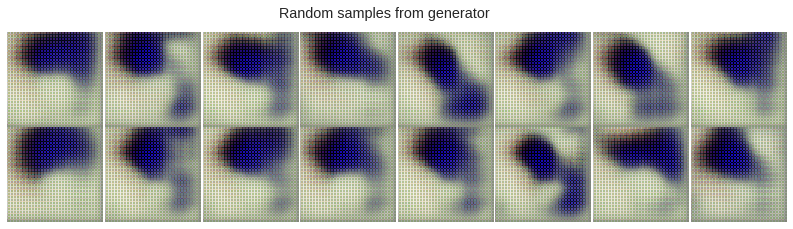

Epoch 0, batch 250/4052: discriminator loss 36.451, generator loss 1.018:   6%|▌         | 249/4052 [02:43<41:12,  1.54it/s]

Epoch 0, batch 500/4052: discriminator loss -26.194, generator loss 2.743:  12%|█▏        | 499/4052 [05:27<38:47,  1.53it/s]

Epoch 0, batch 750/4052: discriminator loss -116.310, generator loss 3.878:  18%|█▊        | 749/4052 [08:09<35:33,  1.55it/s]

Epoch 0, batch 1000/4052: discriminator loss -63.779, generator loss -1.469:  25%|██▍       | 999/4052 [10:51<32:44,  1.55it/s]

Epoch 0, batch 1050/4052: discriminator loss -51.205, generator loss 3.330:  26%|██▌       | 1049/4052 [11:23<32:21,  1.55it/s]

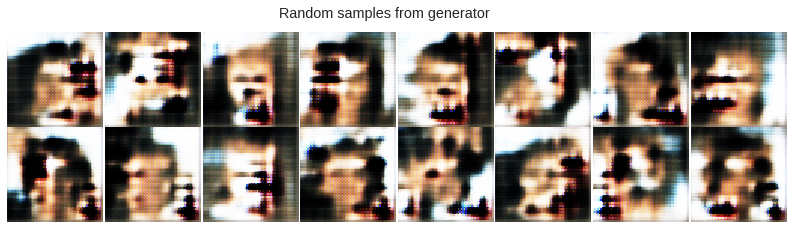

Epoch 0, batch 1250/4052: discriminator loss -64.882, generator loss 0.800:  31%|███       | 1249/4052 [13:33<30:07,  1.55it/s]

Epoch 0, batch 1500/4052: discriminator loss 6.949, generator loss 0.133:  37%|███▋      | 1499/4052 [16:15<27:20,  1.56it/s]

Epoch 0, batch 1750/4052: discriminator loss -81.262, generator loss 0.838:  43%|████▎     | 1749/4052 [18:55<24:37,  1.56it/s]

Epoch 0, batch 2000/4052: discriminator loss -32.653, generator loss -3.826:  49%|████▉     | 1999/4052 [21:36<22:02,  1.55it/s]

Epoch 0, batch 2050/4052: discriminator loss -54.675, generator loss 3.037:  51%|█████     | 2049/4052 [22:08<21:35,  1.55it/s]

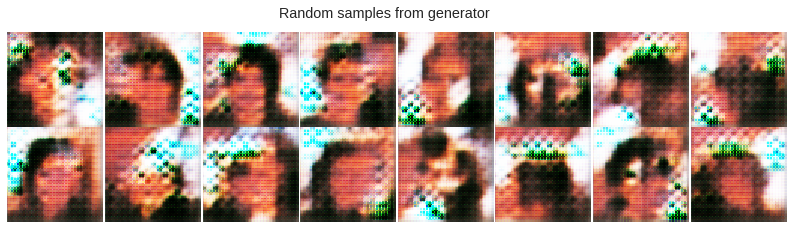

Epoch 0, batch 2250/4052: discriminator loss -26.968, generator loss 2.612:  56%|█████▌    | 2249/4052 [24:18<19:19,  1.56it/s]

Epoch 0, batch 2500/4052: discriminator loss -14.197, generator loss 3.722:  62%|██████▏   | 2499/4052 [26:59<16:41,  1.55it/s]

Epoch 0, batch 2750/4052: discriminator loss -29.442, generator loss 0.521:  68%|██████▊   | 2749/4052 [29:40<14:01,  1.55it/s]

Epoch 0, batch 3000/4052: discriminator loss 52.371, generator loss 5.437:  74%|███████▍  | 2999/4052 [32:21<11:14,  1.56it/s]

Epoch 0, batch 3050/4052: discriminator loss -12.540, generator loss 2.953:  75%|███████▌  | 3049/4052 [32:53<10:43,  1.56it/s]

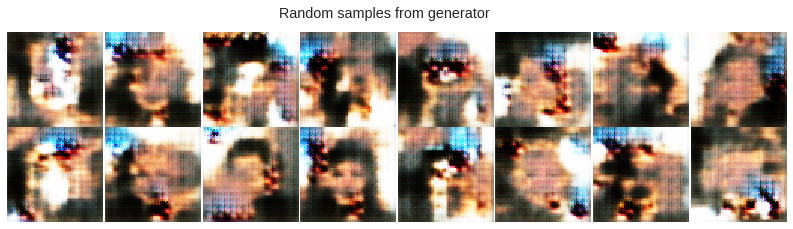

Epoch 0, batch 3250/4052: discriminator loss -32.629, generator loss 1.018:  80%|████████  | 3249/4052 [35:02<08:34,  1.56it/s]

Epoch 0, batch 3500/4052: discriminator loss -12.688, generator loss 0.294:  86%|████████▋ | 3499/4052 [37:43<05:56,  1.55it/s]

Epoch 0, batch 3750/4052: discriminator loss -42.785, generator loss -0.539:  93%|█████████▎| 3749/4052 [40:23<03:14,  1.56it/s]

Epoch 0, batch 4000/4052: discriminator loss -34.409, generator loss -0.644:  99%|█████████▊| 3999/4052 [43:04<00:33,  1.56it/s]

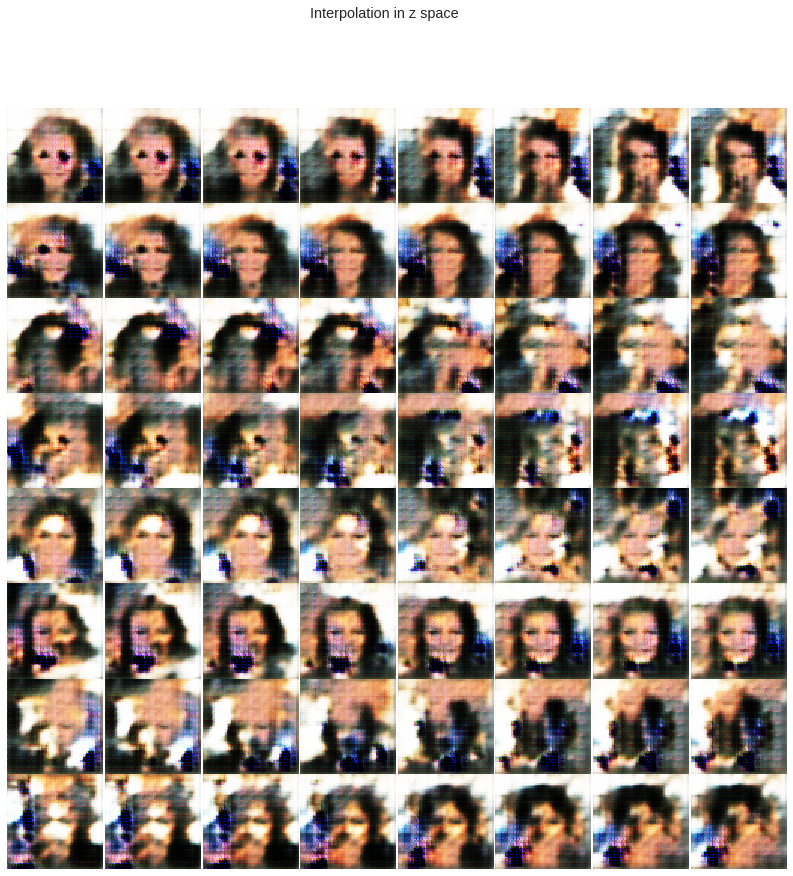

Epoch 0, batch 4050/4052: discriminator loss -51.525, generator loss 0.435: 100%|█████████▉| 4049/4052 [43:40<00:01,  1.56it/s]

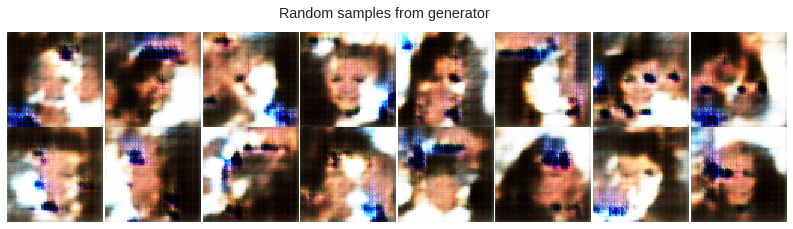

Epoch 1, batch 50/4052: discriminator loss -30.452, generator loss 4.749:   1%|          | 49/4052 [00:31<42:43,  1.56it/s]

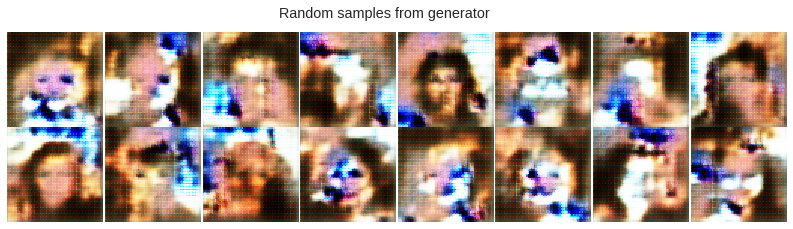

Epoch 1, batch 250/4052: discriminator loss -43.902, generator loss 0.353:   6%|▌         | 249/4052 [02:40<41:15,  1.54it/s]

Epoch 1, batch 500/4052: discriminator loss -9.085, generator loss 1.231:  12%|█▏        | 499/4052 [05:21<37:51,  1.56it/s]

Epoch 1, batch 750/4052: discriminator loss 4.594, generator loss 2.304:  18%|█▊        | 749/4052 [08:02<35:38,  1.54it/s]

Epoch 1, batch 1000/4052: discriminator loss -26.698, generator loss -3.316:  25%|██▍       | 999/4052 [10:42<32:48,  1.55it/s]

Epoch 1, batch 1050/4052: discriminator loss -12.417, generator loss -0.817:  26%|██▌       | 1049/4052 [11:14<32:07,  1.56it/s]

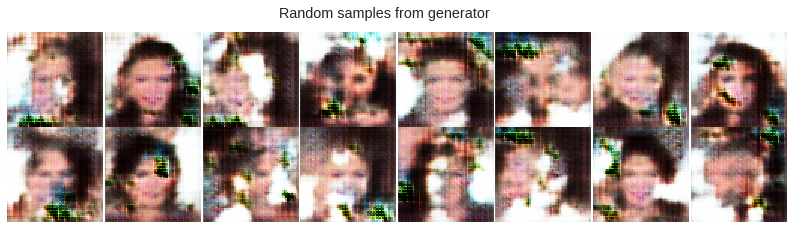

Epoch 1, batch 1250/4052: discriminator loss -43.844, generator loss 2.067:  31%|███       | 1249/4052 [13:24<29:57,  1.56it/s]

Epoch 1, batch 1500/4052: discriminator loss -18.215, generator loss 2.777:  37%|███▋      | 1499/4052 [16:04<27:14,  1.56it/s]

Epoch 1, batch 1750/4052: discriminator loss -71.926, generator loss -0.645:  43%|████▎     | 1749/4052 [18:45<24:37,  1.56it/s]

Epoch 1, batch 2000/4052: discriminator loss -18.689, generator loss 2.384:  49%|████▉     | 1999/4052 [21:25<21:52,  1.56it/s]

Epoch 1, batch 2050/4052: discriminator loss 7.756, generator loss -1.502:  51%|█████     | 2049/4052 [21:57<21:15,  1.57it/s]

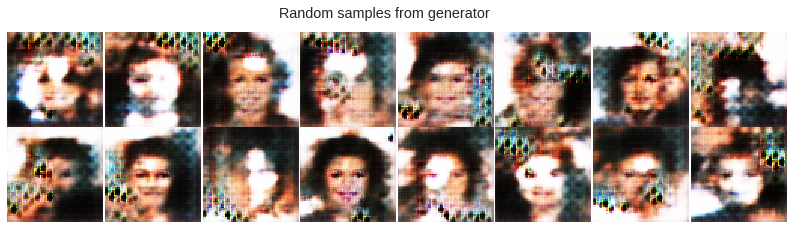

Epoch 1, batch 2250/4052: discriminator loss 3.816, generator loss 0.438:  56%|█████▌    | 2249/4052 [24:06<19:15,  1.56it/s]

Epoch 1, batch 2500/4052: discriminator loss -8.115, generator loss 1.537:  62%|██████▏   | 2499/4052 [26:46<16:36,  1.56it/s]

Epoch 1, batch 2750/4052: discriminator loss 13.185, generator loss -1.350:  68%|██████▊   | 2749/4052 [29:27<13:53,  1.56it/s]

Epoch 1, batch 3000/4052: discriminator loss -17.926, generator loss -2.947:  74%|███████▍  | 2999/4052 [32:07<11:14,  1.56it/s]

Epoch 1, batch 3050/4052: discriminator loss -12.700, generator loss -6.179:  75%|███████▌  | 3049/4052 [32:39<10:42,  1.56it/s]

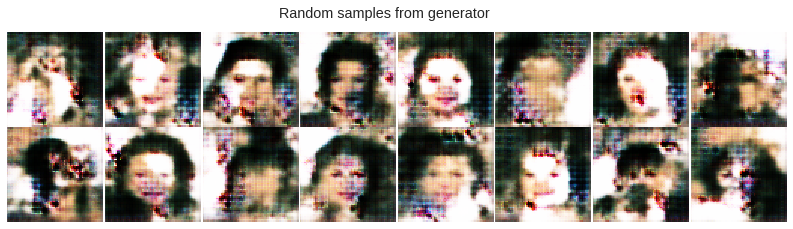

Epoch 1, batch 3250/4052: discriminator loss -11.545, generator loss 0.350:  80%|████████  | 3249/4052 [34:48<08:32,  1.57it/s]

Epoch 1, batch 3500/4052: discriminator loss -22.716, generator loss -3.340:  86%|████████▋ | 3499/4052 [37:28<05:54,  1.56it/s]

Epoch 1, batch 3750/4052: discriminator loss -37.617, generator loss -0.992:  93%|█████████▎| 3749/4052 [40:08<03:14,  1.56it/s]

Epoch 1, batch 4000/4052: discriminator loss -12.815, generator loss 0.111:  99%|█████████▊| 3999/4052 [42:48<00:33,  1.56it/s]

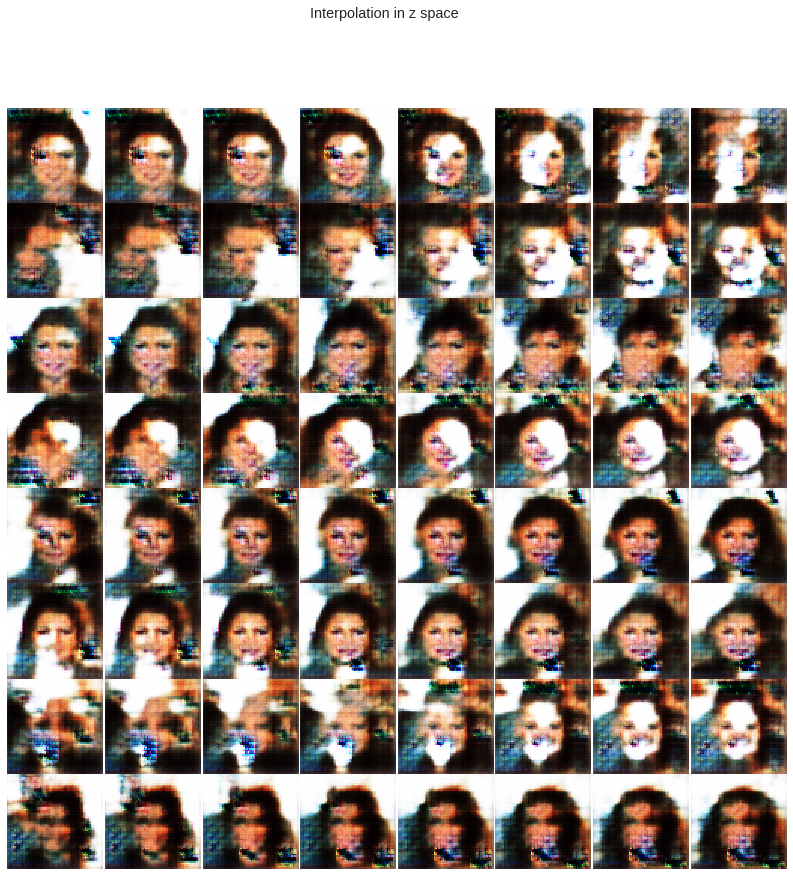

Epoch 1, batch 4050/4052: discriminator loss -22.745, generator loss -1.311: 100%|█████████▉| 4049/4052 [43:24<00:01,  1.56it/s]

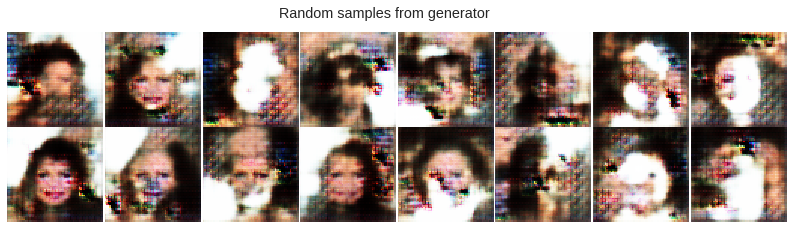

Epoch 2, batch 50/4052: discriminator loss -19.877, generator loss -1.442:   1%|          | 49/4052 [00:31<42:51,  1.56it/s]

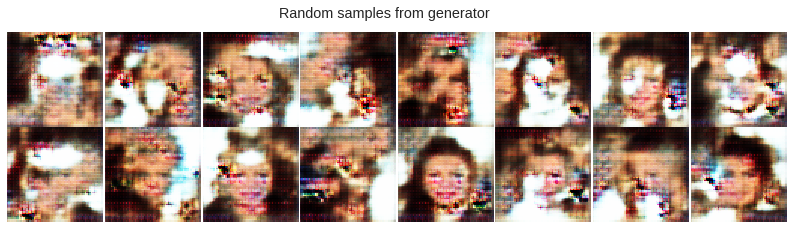

Epoch 2, batch 250/4052: discriminator loss -4.345, generator loss -2.427:   6%|▌         | 249/4052 [02:40<40:30,  1.56it/s]

Epoch 2, batch 500/4052: discriminator loss 1.637, generator loss -1.780:  12%|█▏        | 499/4052 [05:20<37:49,  1.57it/s]

Epoch 2, batch 750/4052: discriminator loss -8.754, generator loss 2.404:  18%|█▊        | 749/4052 [08:00<35:14,  1.56it/s]

Epoch 2, batch 1000/4052: discriminator loss -17.034, generator loss -6.051:  25%|██▍       | 999/4052 [10:40<32:27,  1.57it/s]

Epoch 2, batch 1050/4052: discriminator loss -4.390, generator loss -4.242:  26%|██▌       | 1049/4052 [11:12<31:59,  1.56it/s]

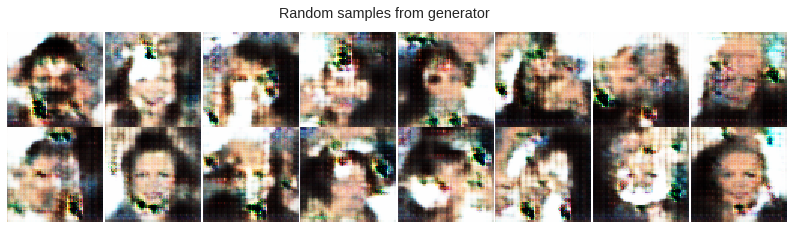

Epoch 2, batch 1250/4052: discriminator loss -8.882, generator loss -2.153:  31%|███       | 1249/4052 [13:20<29:38,  1.58it/s]

Epoch 2, batch 1500/4052: discriminator loss -12.326, generator loss -2.158:  37%|███▋      | 1499/4052 [16:00<27:07,  1.57it/s]

Epoch 2, batch 1750/4052: discriminator loss 12.520, generator loss -2.864:  43%|████▎     | 1749/4052 [18:40<24:36,  1.56it/s]

Epoch 2, batch 2000/4052: discriminator loss -9.520, generator loss 2.755:  49%|████▉     | 1999/4052 [21:20<22:10,  1.54it/s]

Epoch 2, batch 2050/4052: discriminator loss -34.479, generator loss -3.546:  51%|█████     | 2049/4052 [21:52<21:19,  1.57it/s]

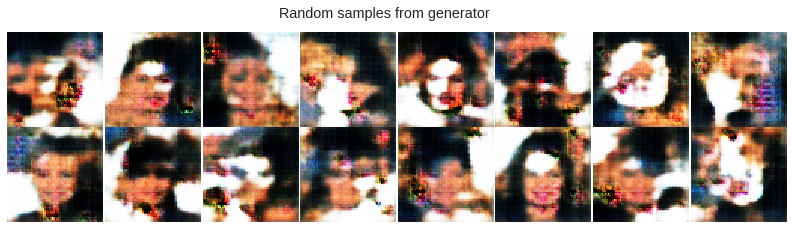

Epoch 2, batch 2250/4052: discriminator loss 3.784, generator loss 1.122:  56%|█████▌    | 2249/4052 [24:00<19:11,  1.57it/s]

Epoch 2, batch 2500/4052: discriminator loss -3.402, generator loss 0.940:  62%|██████▏   | 2499/4052 [26:42<16:53,  1.53it/s]

Epoch 2, batch 2750/4052: discriminator loss -3.395, generator loss -4.090:  68%|██████▊   | 2749/4052 [29:25<14:16,  1.52it/s]

Epoch 2, batch 3000/4052: discriminator loss -27.893, generator loss -1.195:  74%|███████▍  | 2999/4052 [32:08<11:20,  1.55it/s]

Epoch 2, batch 3050/4052: discriminator loss 21.100, generator loss -10.192:  75%|███████▌  | 3049/4052 [32:41<10:55,  1.53it/s]

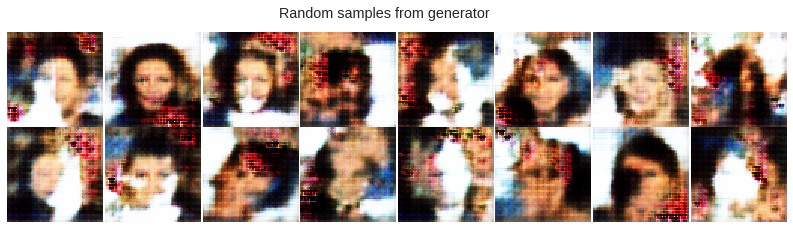

Epoch 2, batch 3250/4052: discriminator loss 9.114, generator loss 3.255:  80%|████████  | 3249/4052 [34:53<08:43,  1.54it/s]

Epoch 2, batch 3500/4052: discriminator loss -18.751, generator loss -1.424:  86%|████████▋ | 3499/4052 [37:36<05:59,  1.54it/s]

Epoch 2, batch 3750/4052: discriminator loss -7.273, generator loss -3.658:  93%|█████████▎| 3749/4052 [40:18<03:18,  1.53it/s]

Epoch 2, batch 4000/4052: discriminator loss -0.914, generator loss -2.122:  99%|█████████▊| 3999/4052 [43:01<00:34,  1.54it/s]

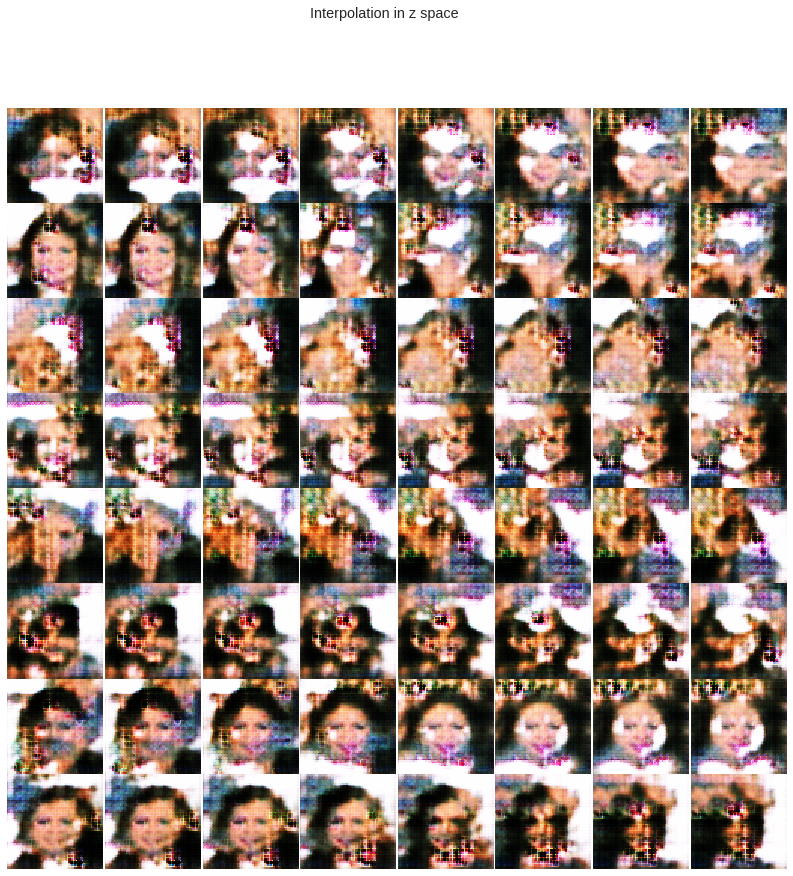

Epoch 2, batch 4050/4052: discriminator loss -2.732, generator loss 2.160: 100%|█████████▉| 4049/4052 [43:37<00:01,  1.54it/s]

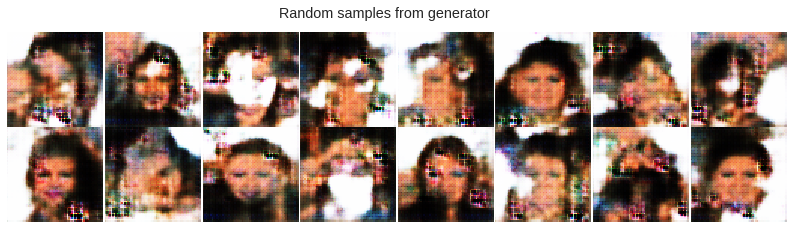

Epoch 3, batch 50/4052: discriminator loss -9.040, generator loss -1.295:   1%|          | 49/4052 [00:31<43:12,  1.54it/s]

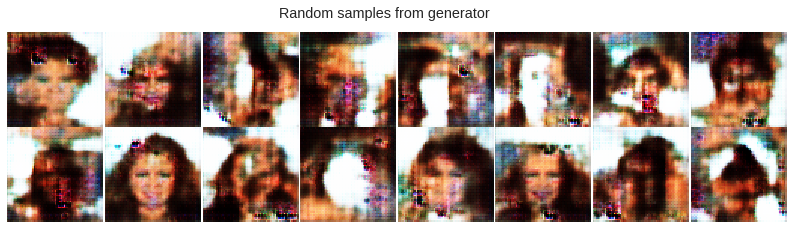

Epoch 3, batch 250/4052: discriminator loss -7.713, generator loss -3.923:   6%|▌         | 249/4052 [02:42<41:18,  1.53it/s]

Epoch 3, batch 500/4052: discriminator loss 3.767, generator loss -3.375:  12%|█▏        | 499/4052 [05:25<38:17,  1.55it/s]

Epoch 3, batch 750/4052: discriminator loss -16.461, generator loss -2.724:  18%|█▊        | 749/4052 [08:08<35:39,  1.54it/s]

Epoch 3, batch 1000/4052: discriminator loss -5.939, generator loss 3.603:  25%|██▍       | 999/4052 [10:51<32:59,  1.54it/s]

Epoch 3, batch 1050/4052: discriminator loss -6.426, generator loss 3.196:  26%|██▌       | 1049/4052 [11:23<32:18,  1.55it/s]

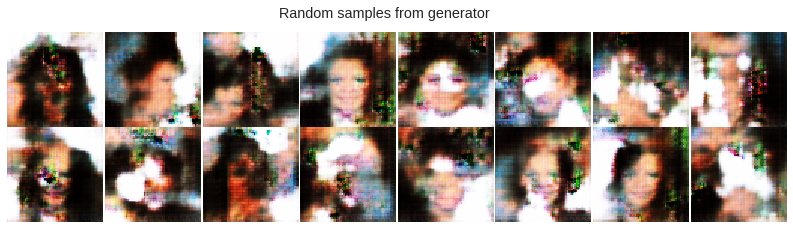

Epoch 3, batch 1250/4052: discriminator loss -13.828, generator loss -6.171:  31%|███       | 1249/4052 [13:35<30:31,  1.53it/s]

Epoch 3, batch 1500/4052: discriminator loss -31.638, generator loss -3.564:  37%|███▋      | 1499/4052 [16:18<27:38,  1.54it/s]

Epoch 3, batch 1750/4052: discriminator loss -7.663, generator loss -2.406:  43%|████▎     | 1749/4052 [19:01<24:54,  1.54it/s]

Epoch 3, batch 2000/4052: discriminator loss 2.647, generator loss -0.763:  49%|████▉     | 1999/4052 [21:44<22:13,  1.54it/s]

Epoch 3, batch 2050/4052: discriminator loss -22.870, generator loss -5.325:  51%|█████     | 2049/4052 [22:17<21:30,  1.55it/s]

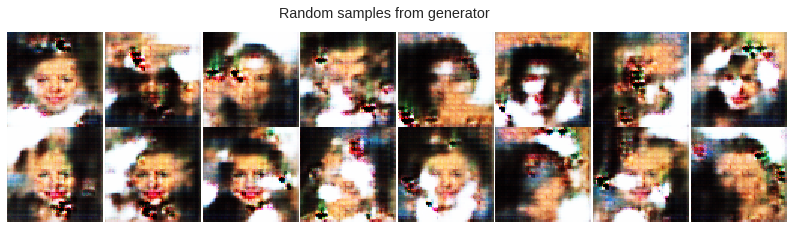

Epoch 3, batch 2250/4052: discriminator loss -1.278, generator loss -7.031:  56%|█████▌    | 2249/4052 [24:28<19:22,  1.55it/s]

Epoch 3, batch 2500/4052: discriminator loss -5.263, generator loss -5.301:  62%|██████▏   | 2499/4052 [27:11<16:47,  1.54it/s]

Epoch 3, batch 2750/4052: discriminator loss -14.913, generator loss -0.827:  68%|██████▊   | 2749/4052 [29:54<14:09,  1.53it/s]

Epoch 3, batch 3000/4052: discriminator loss -14.377, generator loss -10.590:  74%|███████▍  | 2999/4052 [32:37<11:18,  1.55it/s]

Epoch 3, batch 3050/4052: discriminator loss -4.736, generator loss -9.384:  75%|███████▌  | 3049/4052 [33:09<10:54,  1.53it/s]

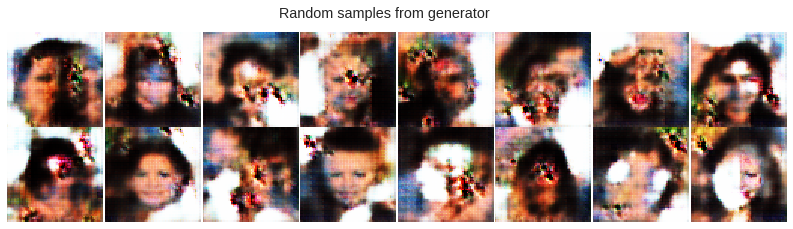

Epoch 3, batch 3250/4052: discriminator loss -0.099, generator loss -6.082:  80%|████████  | 3249/4052 [35:21<08:42,  1.54it/s]

Epoch 3, batch 3500/4052: discriminator loss -25.204, generator loss -7.555:  86%|████████▋ | 3499/4052 [38:04<05:57,  1.55it/s]

Epoch 3, batch 3750/4052: discriminator loss -4.026, generator loss -2.831:  93%|█████████▎| 3749/4052 [40:46<03:15,  1.55it/s]

Epoch 3, batch 4000/4052: discriminator loss -12.423, generator loss -2.063:  99%|█████████▊| 3999/4052 [43:29<00:34,  1.54it/s]

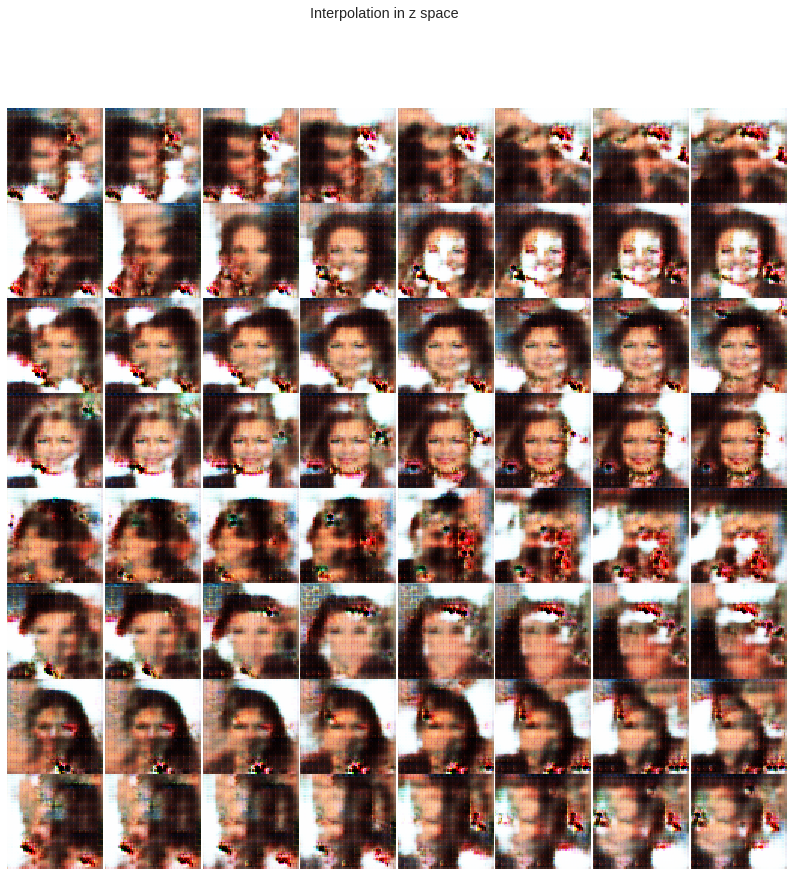

Epoch 3, batch 4050/4052: discriminator loss -1.664, generator loss -1.988: 100%|█████████▉| 4049/4052 [44:06<00:01,  1.54it/s]

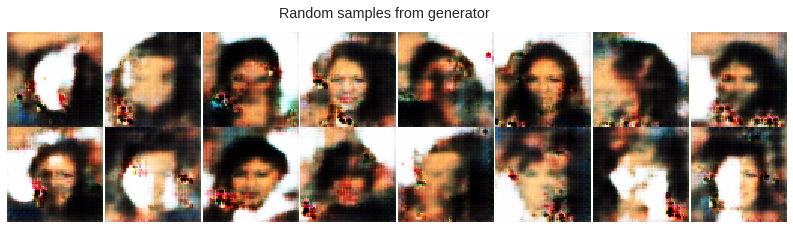

Epoch 4, batch 50/4052: discriminator loss 16.775, generator loss -7.889:   1%|          | 49/4052 [00:31<43:14,  1.54it/s]

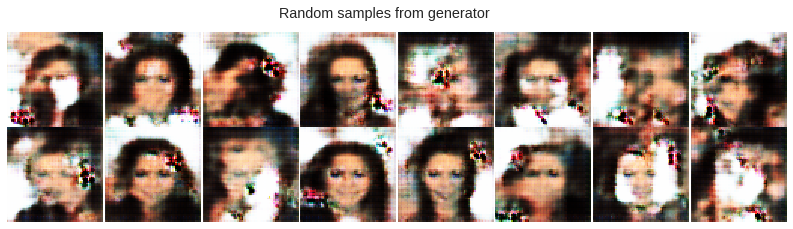

Epoch 4, batch 250/4052: discriminator loss 1.784, generator loss -9.197:   6%|▌         | 249/4052 [02:42<41:01,  1.55it/s]

Epoch 4, batch 500/4052: discriminator loss -3.247, generator loss -3.994:  12%|█▏        | 499/4052 [05:24<38:14,  1.55it/s]

Epoch 4, batch 750/4052: discriminator loss -10.359, generator loss -1.335:  18%|█▊        | 749/4052 [08:07<35:41,  1.54it/s]

Epoch 4, batch 1000/4052: discriminator loss -0.833, generator loss -9.396:  25%|██▍       | 999/4052 [10:50<33:17,  1.53it/s]

Epoch 4, batch 1050/4052: discriminator loss -8.810, generator loss -4.699:  26%|██▌       | 1049/4052 [11:23<32:35,  1.54it/s]

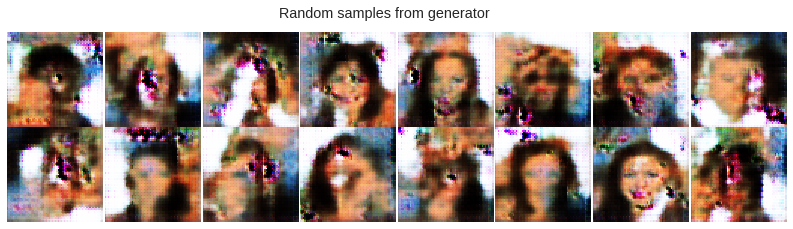

Epoch 4, batch 1250/4052: discriminator loss -21.628, generator loss -4.367:  31%|███       | 1249/4052 [13:34<30:38,  1.52it/s]

Epoch 4, batch 1500/4052: discriminator loss -12.819, generator loss -7.606:  37%|███▋      | 1499/4052 [16:17<27:51,  1.53it/s]

Epoch 4, batch 1750/4052: discriminator loss -13.940, generator loss -7.764:  43%|████▎     | 1749/4052 [19:00<25:08,  1.53it/s]

Epoch 4, batch 2000/4052: discriminator loss -1.251, generator loss -3.911:  49%|████▉     | 1999/4052 [21:43<22:27,  1.52it/s]

Epoch 4, batch 2050/4052: discriminator loss -20.905, generator loss -3.471:  51%|█████     | 2049/4052 [22:16<21:37,  1.54it/s]

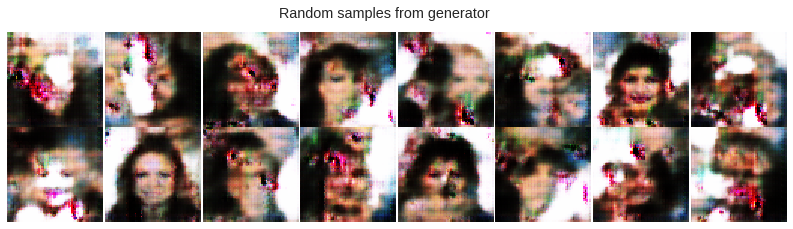

Epoch 4, batch 2250/4052: discriminator loss -16.186, generator loss -5.965:  56%|█████▌    | 2249/4052 [24:27<19:33,  1.54it/s]

Epoch 4, batch 2500/4052: discriminator loss -8.569, generator loss -13.687:  62%|██████▏   | 2499/4052 [27:10<16:39,  1.55it/s]

Epoch 4, batch 2750/4052: discriminator loss -8.943, generator loss -7.243:  68%|██████▊   | 2749/4052 [29:53<14:10,  1.53it/s]

Epoch 4, batch 3000/4052: discriminator loss -8.710, generator loss 0.143:  74%|███████▍  | 2999/4052 [32:36<11:26,  1.53it/s]

Epoch 4, batch 3050/4052: discriminator loss -16.323, generator loss -2.935:  75%|███████▌  | 3049/4052 [33:08<10:55,  1.53it/s]

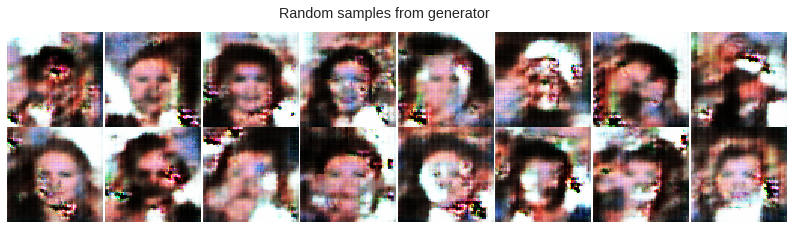

Epoch 4, batch 3250/4052: discriminator loss -16.476, generator loss -4.535:  80%|████████  | 3249/4052 [35:20<08:46,  1.52it/s]

Epoch 4, batch 3500/4052: discriminator loss -1.810, generator loss 1.478:  86%|████████▋ | 3499/4052 [38:03<06:03,  1.52it/s]

Epoch 4, batch 3750/4052: discriminator loss 4.831, generator loss -1.129:  93%|█████████▎| 3749/4052 [40:46<03:17,  1.53it/s]

Epoch 4, batch 4000/4052: discriminator loss -27.134, generator loss -5.459:  99%|█████████▊| 3999/4052 [43:29<00:34,  1.54it/s]

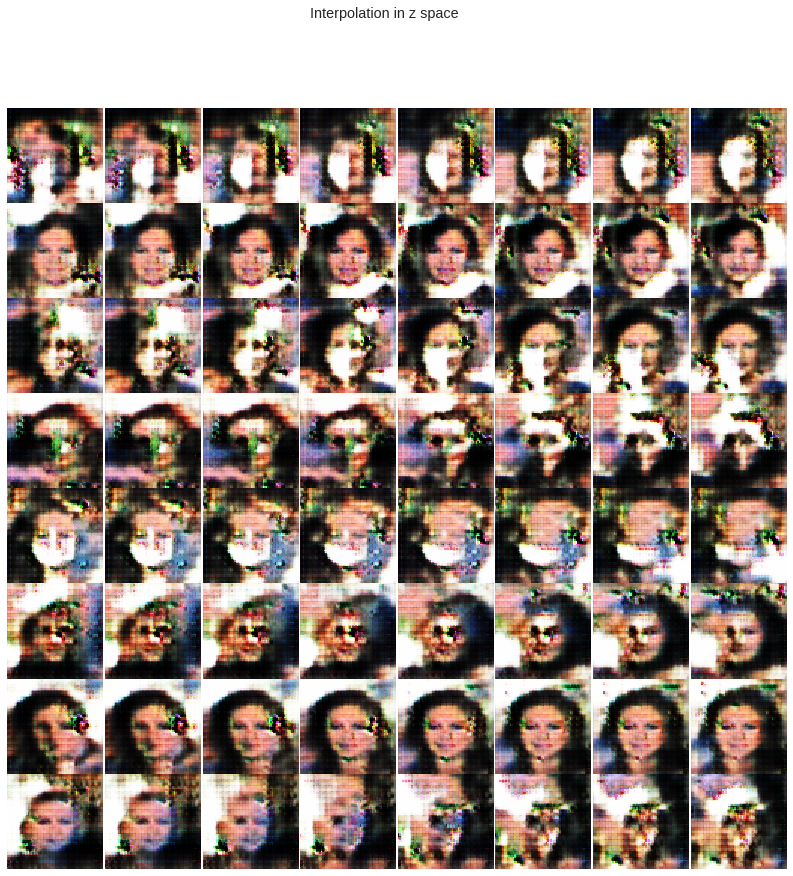

Epoch 4, batch 4050/4052: discriminator loss -16.677, generator loss -6.291: 100%|█████████▉| 4049/4052 [44:05<00:01,  1.54it/s]

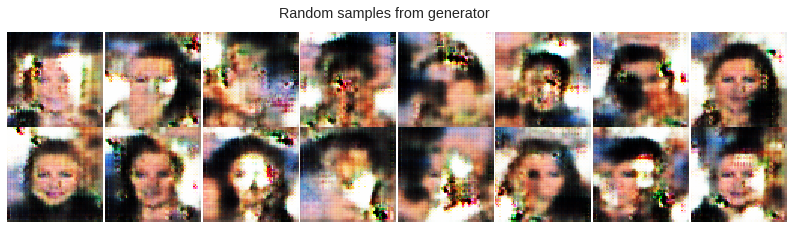

Epoch 5, batch 50/4052: discriminator loss 28.711, generator loss -4.306:   1%|          | 49/4052 [00:32<43:17,  1.54it/s]

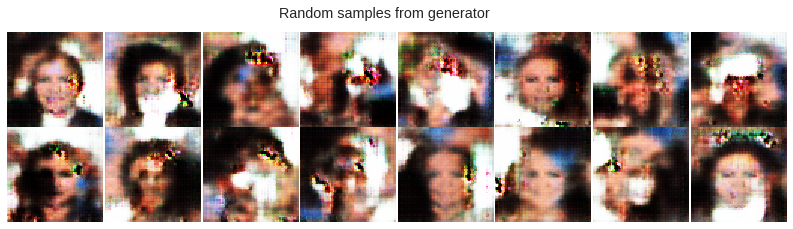

Epoch 5, batch 250/4052: discriminator loss 6.848, generator loss -5.594:   6%|▌         | 249/4052 [02:42<40:49,  1.55it/s]

Epoch 5, batch 500/4052: discriminator loss -16.048, generator loss -0.578:  12%|█▏        | 499/4052 [05:25<38:36,  1.53it/s]

Epoch 5, batch 750/4052: discriminator loss -11.775, generator loss -4.564:  18%|█▊        | 749/4052 [08:08<35:47,  1.54it/s]

Epoch 5, batch 1000/4052: discriminator loss 13.204, generator loss -0.585:  25%|██▍       | 999/4052 [10:51<33:09,  1.53it/s]

Epoch 5, batch 1050/4052: discriminator loss -4.850, generator loss -8.358:  26%|██▌       | 1049/4052 [11:24<32:44,  1.53it/s]

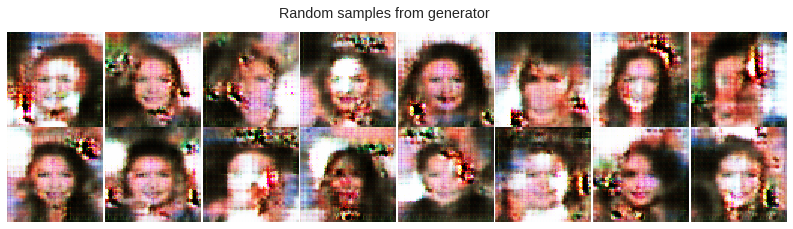

Epoch 5, batch 1250/4052: discriminator loss 3.673, generator loss -5.813:  31%|███       | 1249/4052 [13:36<30:30,  1.53it/s]

Epoch 5, batch 1500/4052: discriminator loss -6.434, generator loss -5.491:  37%|███▋      | 1499/4052 [16:18<27:52,  1.53it/s]

Epoch 5, batch 1750/4052: discriminator loss 15.813, generator loss 2.997:  43%|████▎     | 1749/4052 [19:01<25:00,  1.53it/s]

Epoch 5, batch 2000/4052: discriminator loss -0.301, generator loss -2.370:  49%|████▉     | 1999/4052 [21:44<22:09,  1.54it/s]

Epoch 5, batch 2050/4052: discriminator loss 4.237, generator loss -1.667:  51%|█████     | 2049/4052 [22:17<21:47,  1.53it/s]

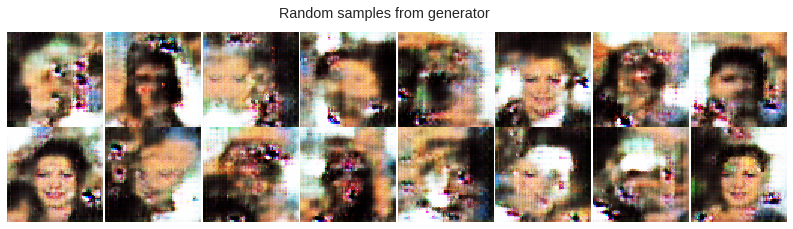

Epoch 5, batch 2250/4052: discriminator loss -3.799, generator loss -9.855:  56%|█████▌    | 2249/4052 [24:28<19:41,  1.53it/s]

Epoch 5, batch 2500/4052: discriminator loss -3.815, generator loss -8.436:  62%|██████▏   | 2499/4052 [27:11<16:54,  1.53it/s]

Epoch 5, batch 2750/4052: discriminator loss -2.303, generator loss -4.513:  68%|██████▊   | 2749/4052 [29:54<14:10,  1.53it/s]

Epoch 5, batch 3000/4052: discriminator loss -7.451, generator loss -8.049:  74%|███████▍  | 2999/4052 [32:37<11:22,  1.54it/s]

Epoch 5, batch 3050/4052: discriminator loss -9.521, generator loss -10.012:  75%|███████▌  | 3049/4052 [33:09<10:55,  1.53it/s]

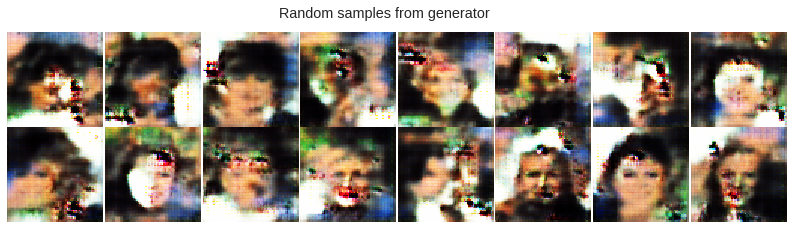

Epoch 5, batch 3250/4052: discriminator loss -22.457, generator loss -3.013:  80%|████████  | 3249/4052 [35:20<08:42,  1.54it/s]

Epoch 5, batch 3500/4052: discriminator loss 10.969, generator loss -10.361:  86%|████████▋ | 3499/4052 [38:03<06:00,  1.53it/s]

Epoch 5, batch 3750/4052: discriminator loss -26.705, generator loss -4.790:  93%|█████████▎| 3749/4052 [40:46<03:16,  1.54it/s]

Epoch 5, batch 4000/4052: discriminator loss -19.599, generator loss -10.942:  99%|█████████▊| 3999/4052 [43:28<00:34,  1.54it/s]

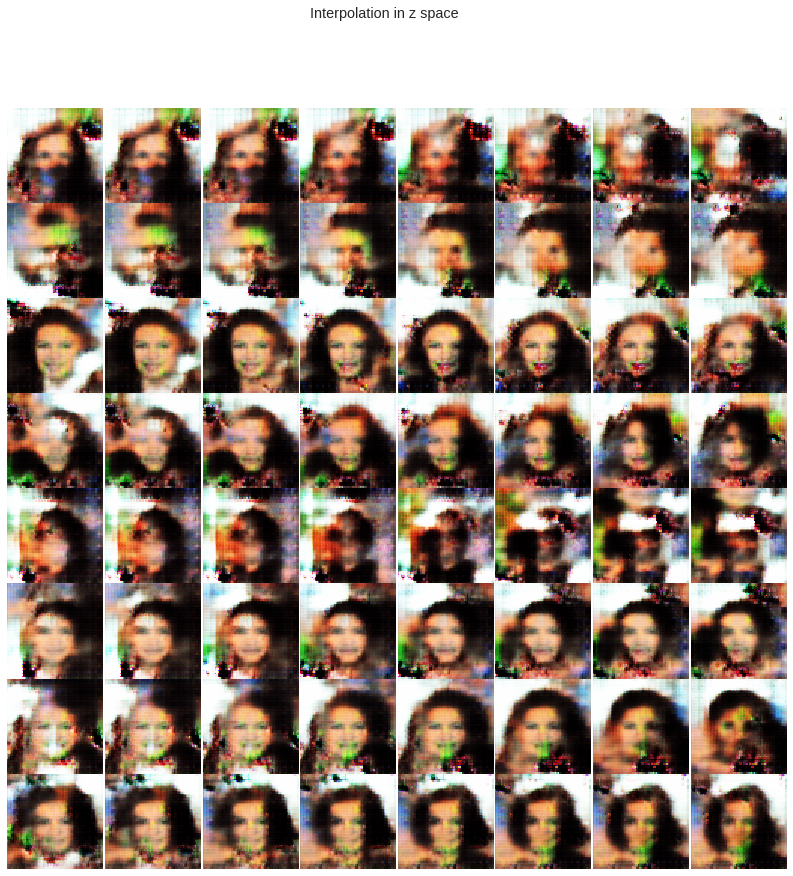

Epoch 5, batch 4050/4052: discriminator loss -11.516, generator loss -15.536: 100%|█████████▉| 4049/4052 [44:04<00:01,  1.55it/s]

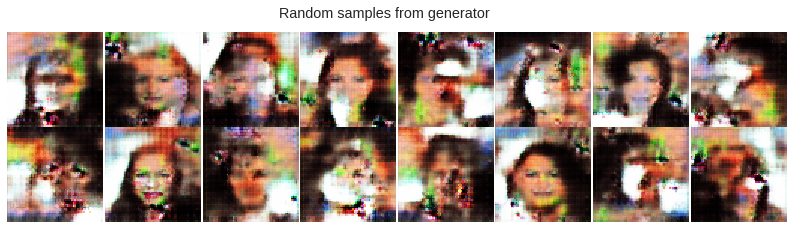

Epoch 6, batch 50/4052: discriminator loss -13.101, generator loss -12.286:   1%|          | 49/4052 [00:32<43:19,  1.54it/s]

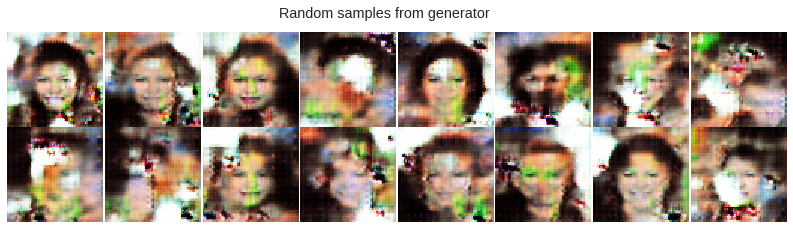

Epoch 6, batch 250/4052: discriminator loss -9.315, generator loss -14.185:   6%|▌         | 249/4052 [02:43<41:27,  1.53it/s]

Epoch 6, batch 500/4052: discriminator loss -20.285, generator loss -7.570:  12%|█▏        | 499/4052 [05:26<38:10,  1.55it/s]

Epoch 6, batch 750/4052: discriminator loss -20.862, generator loss -10.145:  18%|█▊        | 749/4052 [08:09<35:57,  1.53it/s]

Epoch 6, batch 1000/4052: discriminator loss -0.377, generator loss -7.094:  25%|██▍       | 999/4052 [10:52<33:08,  1.54it/s]

Epoch 6, batch 1050/4052: discriminator loss -0.865, generator loss -6.996:  26%|██▌       | 1049/4052 [11:25<32:36,  1.53it/s]

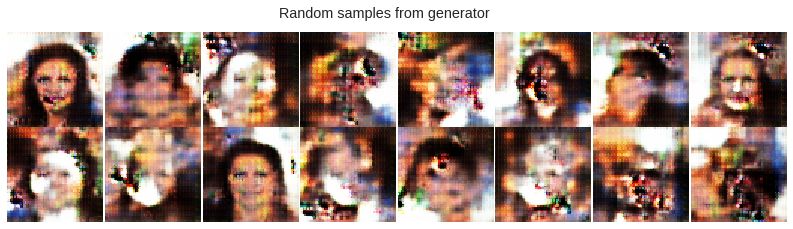

Epoch 6, batch 1250/4052: discriminator loss -4.309, generator loss -5.421:  31%|███       | 1249/4052 [13:36<30:06,  1.55it/s]

Epoch 6, batch 1500/4052: discriminator loss -24.988, generator loss -5.520:  37%|███▋      | 1499/4052 [16:18<27:43,  1.53it/s]

Epoch 6, batch 1750/4052: discriminator loss 1.439, generator loss -4.348:  43%|████▎     | 1749/4052 [19:01<25:01,  1.53it/s]

Epoch 6, batch 2000/4052: discriminator loss -1.553, generator loss -8.912:  49%|████▉     | 1999/4052 [21:44<22:13,  1.54it/s]

Epoch 6, batch 2050/4052: discriminator loss -12.756, generator loss -9.225:  51%|█████     | 2049/4052 [22:16<21:42,  1.54it/s]

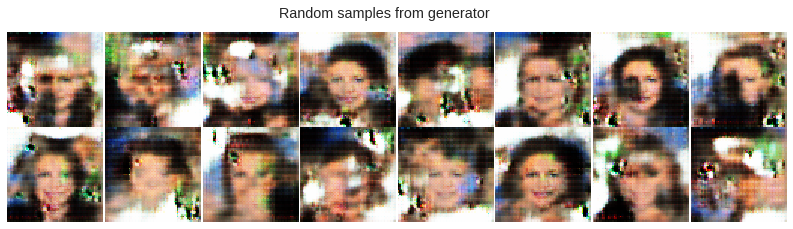

Epoch 6, batch 2250/4052: discriminator loss -15.702, generator loss -10.359:  56%|█████▌    | 2249/4052 [24:28<19:36,  1.53it/s]

Epoch 6, batch 2500/4052: discriminator loss -8.781, generator loss -8.241:  62%|██████▏   | 2499/4052 [27:10<16:37,  1.56it/s]

Epoch 6, batch 2750/4052: discriminator loss -15.151, generator loss -5.762:  68%|██████▊   | 2749/4052 [29:53<14:07,  1.54it/s]

Epoch 6, batch 3000/4052: discriminator loss -9.323, generator loss -5.930:  74%|███████▍  | 2999/4052 [32:36<11:25,  1.54it/s]

Epoch 6, batch 3050/4052: discriminator loss -10.107, generator loss -5.961:  75%|███████▌  | 3049/4052 [33:08<10:55,  1.53it/s]

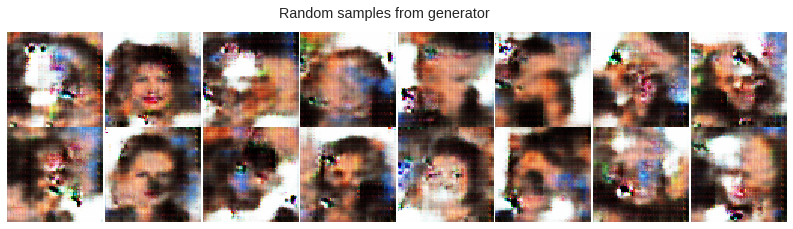

Epoch 6, batch 3250/4052: discriminator loss -19.154, generator loss -9.795:  80%|████████  | 3249/4052 [35:19<08:39,  1.55it/s]

Epoch 6, batch 3500/4052: discriminator loss 3.520, generator loss -7.219:  86%|████████▋ | 3499/4052 [38:02<05:59,  1.54it/s]

Epoch 6, batch 3750/4052: discriminator loss -9.861, generator loss -6.895:  93%|█████████▎| 3749/4052 [40:45<03:18,  1.53it/s]

Epoch 6, batch 4000/4052: discriminator loss -5.581, generator loss -6.158:  99%|█████████▊| 3999/4052 [43:28<00:34,  1.53it/s]

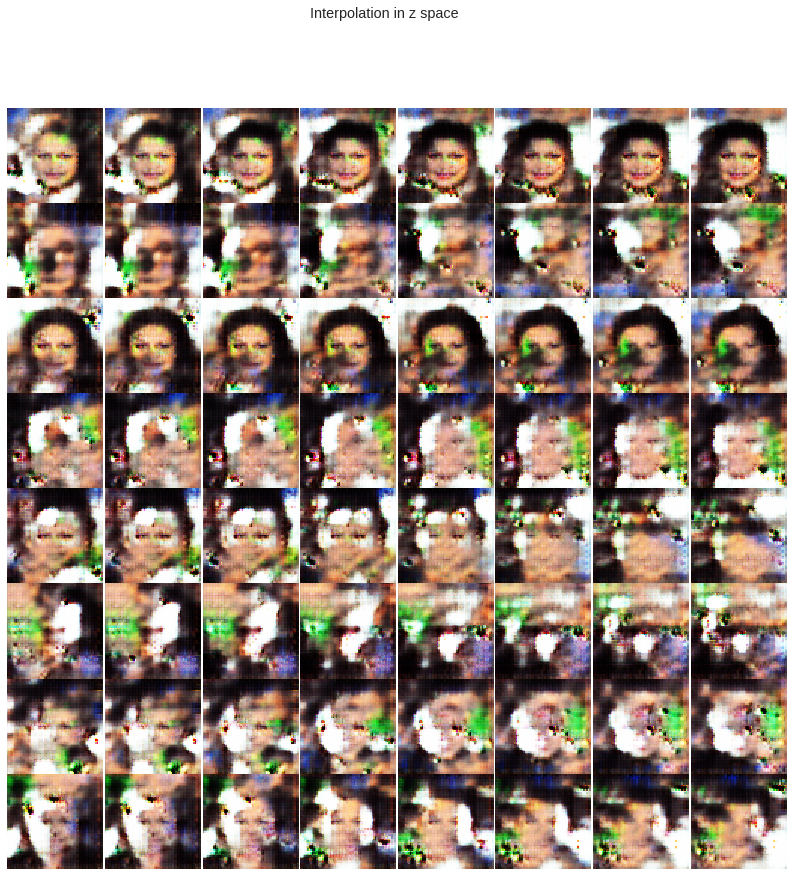

Epoch 6, batch 4050/4052: discriminator loss -5.683, generator loss -3.199: 100%|█████████▉| 4049/4052 [44:05<00:01,  1.54it/s]

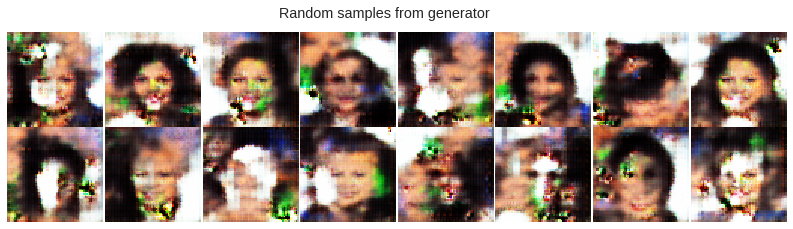

Epoch 7, batch 50/4052: discriminator loss -12.085, generator loss -5.211:   1%|          | 49/4052 [00:31<42:52,  1.56it/s]

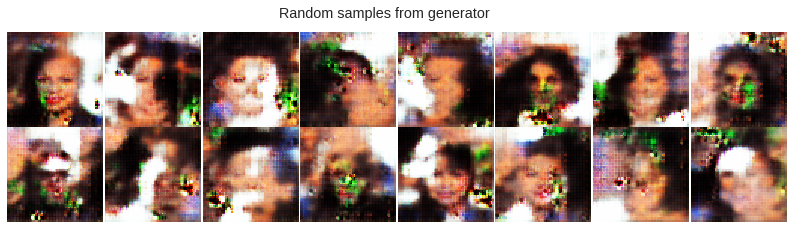

Epoch 7, batch 250/4052: discriminator loss -12.183, generator loss -13.177:   6%|▌         | 249/4052 [02:43<40:56,  1.55it/s]

Epoch 7, batch 500/4052: discriminator loss -26.404, generator loss -6.045:  12%|█▏        | 499/4052 [05:26<38:46,  1.53it/s]

Epoch 7, batch 750/4052: discriminator loss 6.351, generator loss -8.347:  18%|█▊        | 749/4052 [08:09<36:08,  1.52it/s]

Epoch 7, batch 1000/4052: discriminator loss -2.221, generator loss -8.738:  25%|██▍       | 999/4052 [10:52<33:27,  1.52it/s]

Epoch 7, batch 1050/4052: discriminator loss 3.948, generator loss -8.366:  26%|██▌       | 1049/4052 [11:25<32:57,  1.52it/s]

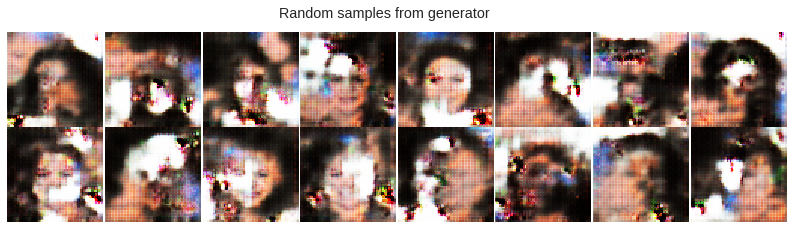

Epoch 7, batch 1250/4052: discriminator loss 6.760, generator loss -2.850:  31%|███       | 1249/4052 [13:36<30:31,  1.53it/s]

Epoch 7, batch 1500/4052: discriminator loss -3.070, generator loss -4.069:  37%|███▋      | 1499/4052 [16:20<27:42,  1.54it/s]

Epoch 7, batch 1750/4052: discriminator loss 11.704, generator loss 3.110:  43%|████▎     | 1749/4052 [19:03<24:55,  1.54it/s]

Epoch 7, batch 2000/4052: discriminator loss -5.611, generator loss -7.409:  49%|████▉     | 1999/4052 [21:45<22:11,  1.54it/s]

Epoch 7, batch 2050/4052: discriminator loss -12.820, generator loss -5.668:  51%|█████     | 2049/4052 [22:17<21:42,  1.54it/s]

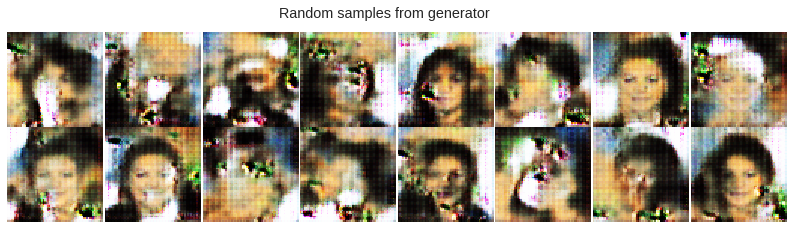

Epoch 7, batch 2250/4052: discriminator loss -18.679, generator loss 0.166:  56%|█████▌    | 2249/4052 [24:28<19:25,  1.55it/s]

Epoch 7, batch 2500/4052: discriminator loss 10.463, generator loss -5.215:  62%|██████▏   | 2499/4052 [27:10<16:53,  1.53it/s]

Epoch 7, batch 2750/4052: discriminator loss -19.904, generator loss -2.470:  68%|██████▊   | 2749/4052 [29:53<14:14,  1.53it/s]

Epoch 7, batch 3000/4052: discriminator loss -26.420, generator loss -7.115:  74%|███████▍  | 2999/4052 [32:37<11:28,  1.53it/s]

Epoch 7, batch 3050/4052: discriminator loss -20.382, generator loss -3.121:  75%|███████▌  | 3049/4052 [33:09<10:49,  1.55it/s]

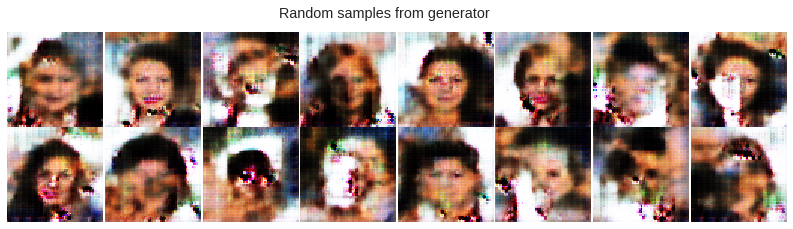

Epoch 7, batch 3250/4052: discriminator loss -13.838, generator loss -1.033:  80%|████████  | 3249/4052 [35:21<08:42,  1.54it/s]

Epoch 7, batch 3500/4052: discriminator loss 4.605, generator loss -2.042:  86%|████████▋ | 3499/4052 [38:04<05:58,  1.54it/s]

Epoch 7, batch 3750/4052: discriminator loss -15.221, generator loss 0.539:  93%|█████████▎| 3749/4052 [40:48<03:17,  1.54it/s]

Epoch 7, batch 3760/4052: discriminator loss -2.353, generator loss 0.723:  93%|█████████▎| 3759/4052 [40:54<03:11,  1.53it/s]

In [0]:
# Do this all in a function so it doesn't eat unnecessary RAM
def main():
    
    # Initialize hyperparameters and such (or make these function arguments)
    num_epochs = 10
    batch_size = 50
    img_size = 64 # can't be smaller than 16 with generator architecture
    
    n_critic = 1 # 5 Shreeya said that doesn't change it
    Lambda = 10
    
    learning_rate = 0.0002 # alpha = 0.0001
    batch_norm_epsilon = 1e-5 # beta1 = 0 (apparently paper vals are worse)
    batch_norm_decay = 0.9 # beta2 = 0.9
    
    discriminator_losses = []
    generator_losses = []
    
    # Initialize the dataset and dataloader
    train_data = CelebDataset('./', size=img_size)
    train_loader = DataLoader(train_data, batch_size=batch_size)
    
    # Initialize generator and discriminator
    generator = Generator(start_shape=int(img_size/16)).cuda()
    generator_optim = optim.Adam(generator.parameters(), lr=learning_rate)
    
    discriminator = Discriminator(img_size=img_size).cuda()
    discriminator_optim = optim.Adam(discriminator.parameters(),
                                     lr=learning_rate)
    

    for epoch in range(num_epochs):
        
        loop = tqdm(total=len(train_loader), position=0, leave=True)
        training_step = 0
        
        for train_image in train_loader:
            
            if training_step*batch_size > 92:
            
                true_image = train_image.cuda()

                ### Train the discriminator ###

                # Make sure we can backpropagate through discriminator parameters
                set_grad_TrueFalse(discriminator, generator)

                for n in range(n_critic):

                    discriminator_optim.zero_grad()

                    # Sample z and call the generator on it to get x_tilde
                    z = torch.randn(true_image.size()[0], 1, 1, 100).cuda()
                    x_tilde = generator(z)

                    # Interpolate between true_image and x_tilde to get xhat
                    eps = np.random.rand()
                    xhat = (eps*true_image + (1 - eps)*x_tilde)
                    xhat.requires_grad_()
                    dhat = discriminator(xhat)

                    # Calculate discriminator loss, including gradient penalty
                    gradient = grad(dhat.sum(), xhat, create_graph=True)
                    gradient_norm = torch.norm(gradient[0])

                    gradient_penalty = Lambda * (gradient_norm - 1)**2
                    discriminator_optim.zero_grad()
                    
                    dloss = discriminator(x_tilde) - discriminator(true_image)
                    discriminator_loss = dloss.sum() + gradient_penalty
                    
                    # Backpropagate and step
                    discriminator_loss.backward()
                    discriminator_losses.append(discriminator_loss.item())
                    discriminator_optim.step()

                ### Train the generator ###

                set_grad_TrueFalse(generator, discriminator)
                generator_optim.zero_grad()

                # Sample a batch of latent variables z
                z = torch.randn(true_image.size()[0], 1, 1, 100).cuda()
                gz = generator(z)

                generator_loss = -torch.mean(discriminator(gz))

                generator_loss.backward()
                generator_losses.append(generator_loss.item())                            
                generator_optim.step()  

                # Update the tdqm loop
                s = 'Epoch {}, batch {}/{}: '.format(epoch, training_step, 
                                                    len(train_loader))

                s += 'discriminator loss {:.3f}'.format(discriminator_losses[-1])
                s += ', generator loss {:.3f}'.format(generator_loss)
                loop.set_description(s)
                loop.update(1)

                if training_step % 250 == 0:
                    print()
                
                # Occasionally plot samples
                if training_step % 1000 == 50:
                    
                    fig = plt.figure(figsize=(14,3.5))
                    num_rows = 2
                    num_cols = 8
                    grid = plt.GridSpec(num_rows, num_cols, wspace=0, hspace=0)
                    for i in range(num_rows * num_cols):
                        display_z = torch.randn(1, 1, 1, 100).cuda()
                        display_g = generator(display_z).squeeze(0)
                        ax = fig.add_subplot(grid[int(i/num_cols), i%num_cols])
                        ax.imshow(display_g.permute(1,2,0).detach())
                        ax.set_yticks([])
                        ax.set_xticks([])
                    plt.suptitle("Random samples from generator")
                    plt.show()
                    
                if training_step % 4000 == 0:
                    
                    fig = plt.figure(figsize=(14,14))
                    num_rows = 8
                    num_cols = 8
                    grid = plt.GridSpec(num_rows, num_cols, wspace=0, hspace=0)

                    for i in range(num_rows):

                        z1 = torch.randn(1, 1, 1, 100).cuda()
                        z2 = torch.randn(1, 1, 1, 100).cuda()
                        middles = np.arange(num_cols)/(num_cols-1)

                        for j in range(num_cols):
                            c = middles[j]
                            x = c*z1 + (1-c)*z2
                            display_g = generator(x.cuda()).squeeze(0)
                            ax = fig.add_subplot(grid[i,j])
                            ax.imshow(display_g.permute(1,2,0).detach())
                            ax.set_yticks([])
                            ax.set_xticks([])
                    plt.suptitle("Interpolation in z space")
                    plt.show() 
                    


            training_step += 1
    
main()